In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt 
import tqdm
import numpy as np

In [2]:
def download_data():
    """Download the MNIST dataset and create a data loader."""
    # MNIST training set
    mnist_train = torchvision.datasets.MNIST(
        root="./dataset",
        train=True,
        download=False,
        transform=torchvision.transforms.ToTensor()
    )
    # MNIST test set
    mnist_test = torchvision.datasets.MNIST(
        root="./dataset",
        train=False,
        download=False,
        transform=torchvision.transforms.ToTensor()
    )
    return mnist_train, mnist_test

Dataset MNIST
    Number of datapoints: 60000
    Root location: ./dataset
    Split: Train
    StandardTransform
Transform: ToTensor()
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./dataset
    Split: Test
    StandardTransform
Transform: ToTensor()
['0 - zero', '1 - one', '2 - two', '3 - three', '4 - four', '5 - five', '6 - six', '7 - seven', '8 - eight', '9 - nine']
tensor([7, 2, 1,  ..., 4, 5, 6])
torch.Size([28, 28])


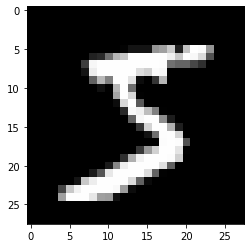

In [3]:
batch_size = 64
mnist_train, mnist_test = download_data()
print(mnist_train)
print(mnist_test)

print(mnist_train.classes)
print(mnist_test.targets)

# visualize first image
print(mnist_train[0][0][0].shape)
plt.imshow(mnist_train[0][0][0], cmap='Greys_r')

In [4]:
train_loader = torch.utils.data.DataLoader(
    mnist_train, batch_size=batch_size, drop_last=True, shuffle=True
)
test_loader = torch.utils.data.DataLoader(
    mnist_test, batch_size=batch_size, drop_last=True, shuffle=True
)

for images, labels in train_loader:
    print(images.shape, labels.shape)
    break
    
# num minibatches 
print(len(train_loader))

torch.Size([64, 1, 28, 28]) torch.Size([64])
937


In [5]:
class Generator(torch.nn.Module):
    def __init__(self, image_shape, hidden_dim):
        super().__init__()
        self.hidden0 = torch.nn.Linear(image_shape, hidden_dim)
        self.hidden1 = torch.nn.Linear(hidden_dim, hidden_dim)
        self.out = torch.nn.Linear(hidden_dim, image_shape)
        self.tanh = torch.nn.Tanh()
        
    def forward(self, x):
        x = torch.nn.functional.relu(self.hidden0(x))
        x = torch.nn.functional.relu(self.hidden1(x))
        return self.tanh(self.out(x))

In [6]:
class Discriminator(torch.nn.Module):
    def __init__(self, image_shape, hidden_dim):
        super().__init__()
        self.hidden0 = torch.nn.Sequential(torch.nn.Linear(image_shape, hidden_dim), torch.nn.LeakyReLU(0.2), torch.nn.Dropout(0.3))
        self.hidden1 = torch.nn.Sequential(torch.nn.Linear(hidden_dim, hidden_dim), torch.nn.LeakyReLU(0.2), torch.nn.Dropout(0.3))
        self.out = torch.nn.Sequential(torch.nn.Linear(hidden_dim, 1), torch.nn.Sigmoid())
        
    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        return self.out(x)

In [7]:
image_shape, hidden_dim = 28 * 28, 256

In [8]:
generator = Generator(image_shape, hidden_dim)
discriminator = Discriminator(image_shape, hidden_dim)

d_optim, g_optim = torch.optim.Adam(
    discriminator.parameters(), lr=0.001
), torch.optim.Adam(
    generator.parameters(), lr=0.001
)
criterion = torch.nn.BCELoss()

In [9]:
def generate_fake_samples(generator):
    latents = torch.randn(batch_size, image_shape)
    # print(latents.shape)
    fake_samples = generator(latents)
    return fake_samples

In [10]:
def display_fake_samples(generated_images):
    fig = plt.figure(figsize=(8, 8))
    columns, rows = 8, 8
    for i in range(1, columns*rows +1):
        # img = np.random.randint(10, size=(10, 10))
        img = torch.unsqueeze(generated_images[i-1], dim=0).view((28, 28))
        fig.add_subplot(rows, columns, i)
        plt.imshow(img, cmap='Greys_r')
    plt.show()

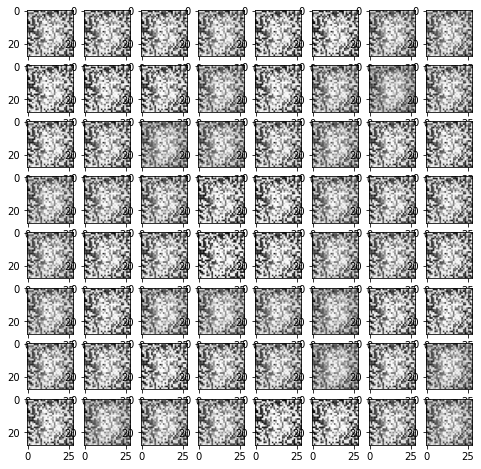

Epoch:  0
Discriminator Real Loss:  tensor(0.8030, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.7632, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(2.6071, grad_fn=<BinaryCrossEntropyBackward0>)


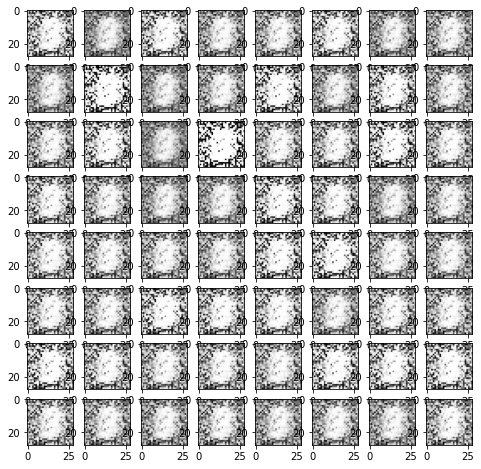

Epoch:  0
Discriminator Real Loss:  tensor(1.8597, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1928, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(13.9923, grad_fn=<BinaryCrossEntropyBackward0>)


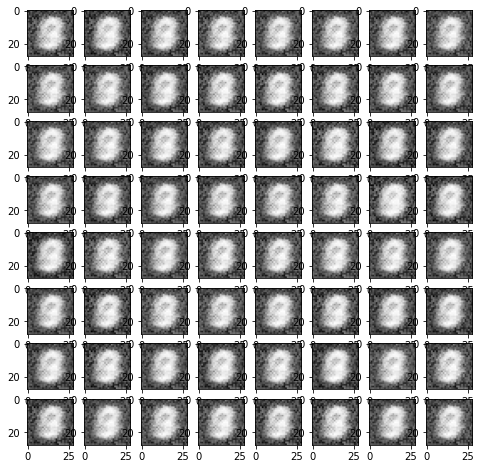

Epoch:  0
Discriminator Real Loss:  tensor(0.9871, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.3725, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(2.6217, grad_fn=<BinaryCrossEntropyBackward0>)


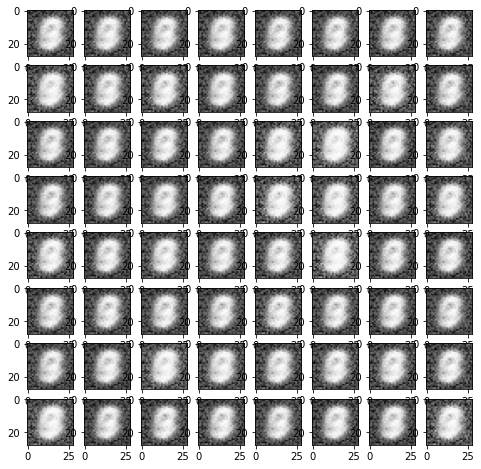

Epoch:  0
Discriminator Real Loss:  tensor(0.4035, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.6835, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.2474, grad_fn=<BinaryCrossEntropyBackward0>)


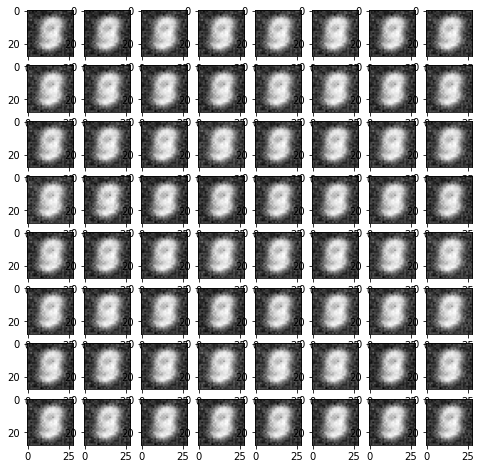

Epoch:  1
Discriminator Real Loss:  tensor(0.4096, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.4186, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(1.8480, grad_fn=<BinaryCrossEntropyBackward0>)


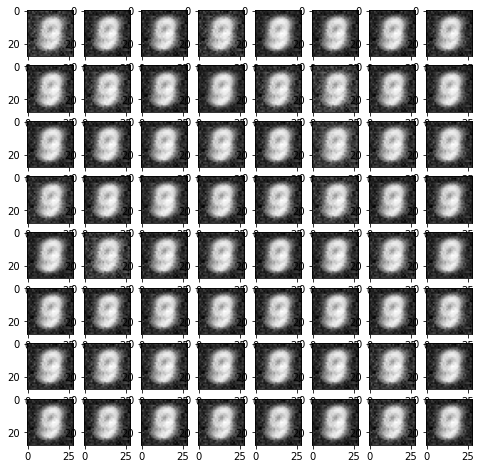

Epoch:  1
Discriminator Real Loss:  tensor(0.1814, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.2905, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(1.9583, grad_fn=<BinaryCrossEntropyBackward0>)


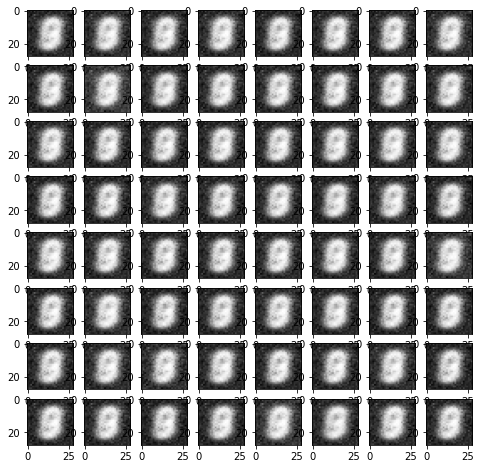

Epoch:  1
Discriminator Real Loss:  tensor(0.3219, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.2209, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(2.2152, grad_fn=<BinaryCrossEntropyBackward0>)


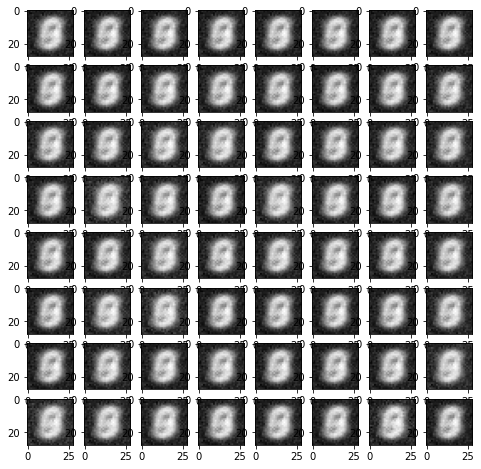

Epoch:  1
Discriminator Real Loss:  tensor(0.1064, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1086, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(2.8365, grad_fn=<BinaryCrossEntropyBackward0>)


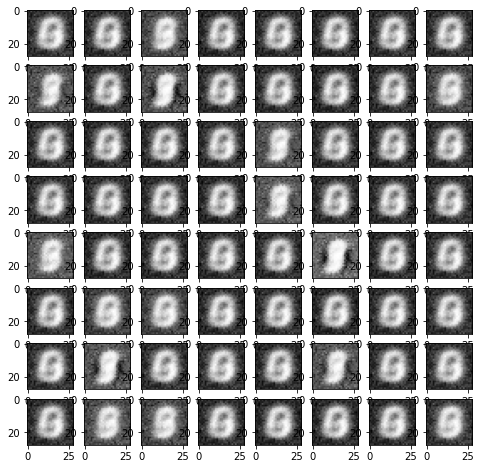

Epoch:  2
Discriminator Real Loss:  tensor(0.5468, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.4872, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(1.9971, grad_fn=<BinaryCrossEntropyBackward0>)


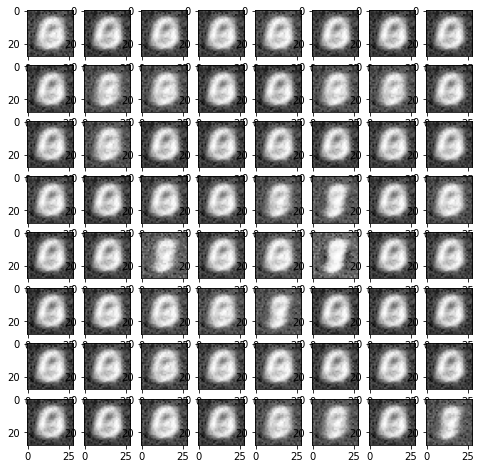

Epoch:  2
Discriminator Real Loss:  tensor(0.1432, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1640, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(2.7754, grad_fn=<BinaryCrossEntropyBackward0>)


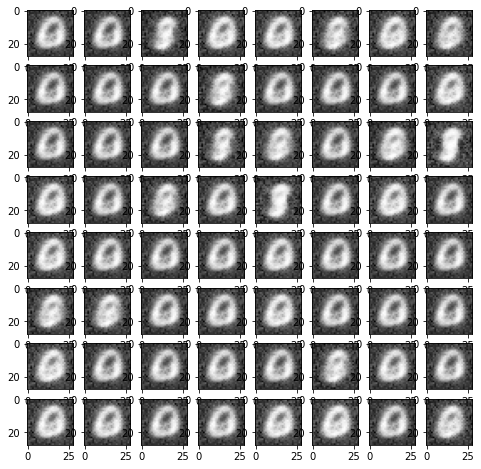

Epoch:  2
Discriminator Real Loss:  tensor(0.2393, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0809, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.8111, grad_fn=<BinaryCrossEntropyBackward0>)


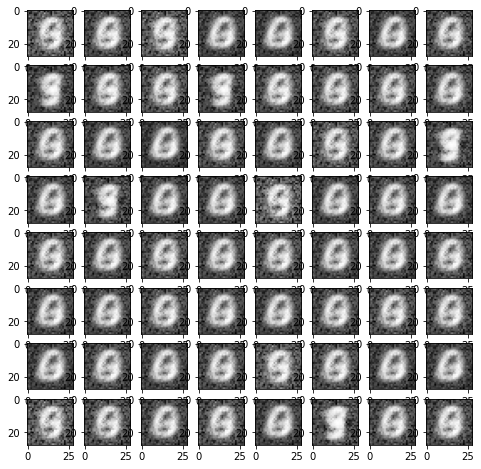

Epoch:  2
Discriminator Real Loss:  tensor(0.0788, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0850, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.9371, grad_fn=<BinaryCrossEntropyBackward0>)


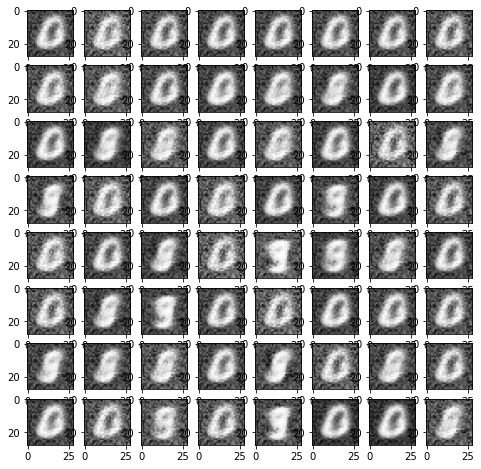

Epoch:  3
Discriminator Real Loss:  tensor(0.1390, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1010, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.0572, grad_fn=<BinaryCrossEntropyBackward0>)


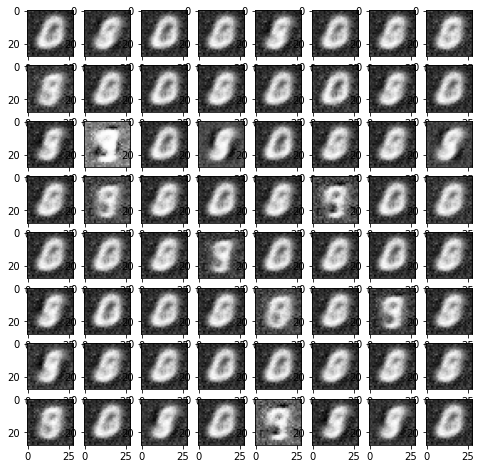

Epoch:  3
Discriminator Real Loss:  tensor(0.1888, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1485, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.8046, grad_fn=<BinaryCrossEntropyBackward0>)


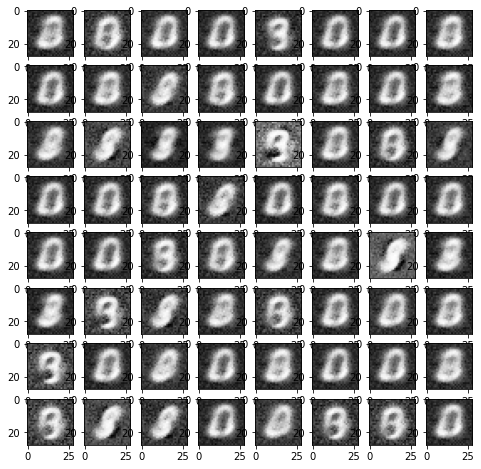

Epoch:  3
Discriminator Real Loss:  tensor(0.0748, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.2310, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.3682, grad_fn=<BinaryCrossEntropyBackward0>)


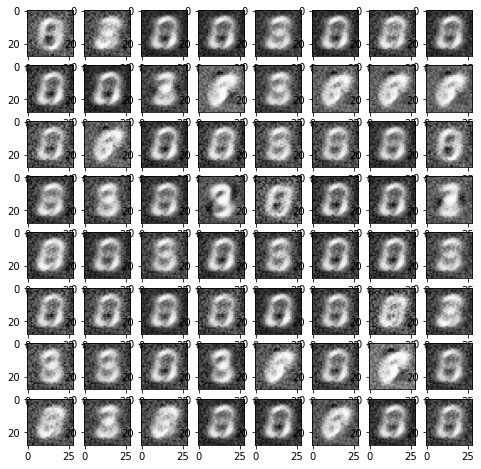

Epoch:  3
Discriminator Real Loss:  tensor(0.2094, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.4400, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.1415, grad_fn=<BinaryCrossEntropyBackward0>)


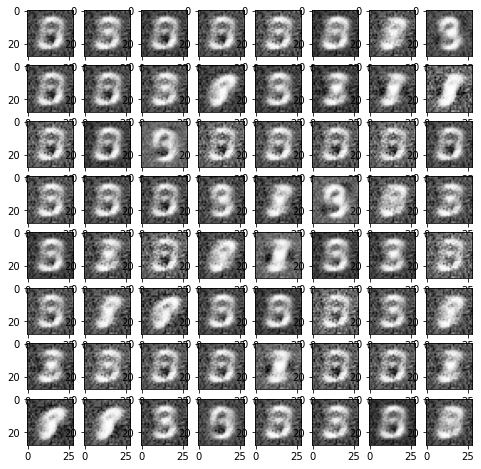

Epoch:  4
Discriminator Real Loss:  tensor(0.0948, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1400, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(6.2321, grad_fn=<BinaryCrossEntropyBackward0>)


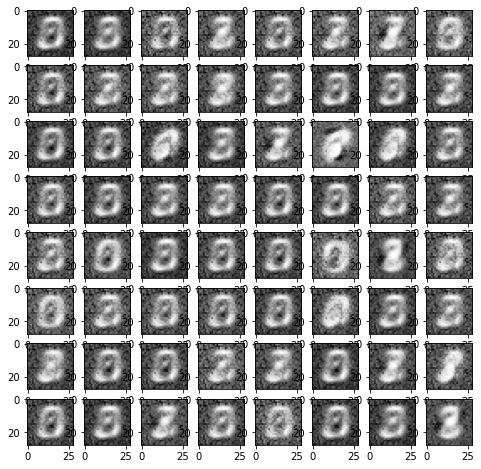

Epoch:  4
Discriminator Real Loss:  tensor(0.1315, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.2243, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(6.2816, grad_fn=<BinaryCrossEntropyBackward0>)


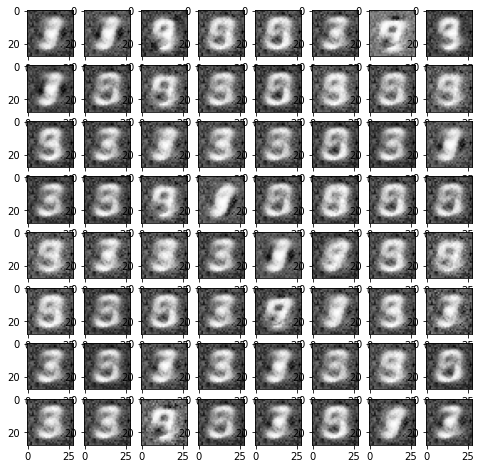

Epoch:  4
Discriminator Real Loss:  tensor(0.2190, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.3531, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.5504, grad_fn=<BinaryCrossEntropyBackward0>)


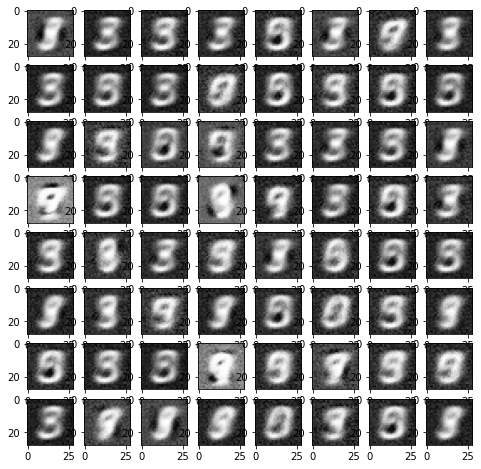

Epoch:  4
Discriminator Real Loss:  tensor(0.1921, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0581, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.1697, grad_fn=<BinaryCrossEntropyBackward0>)


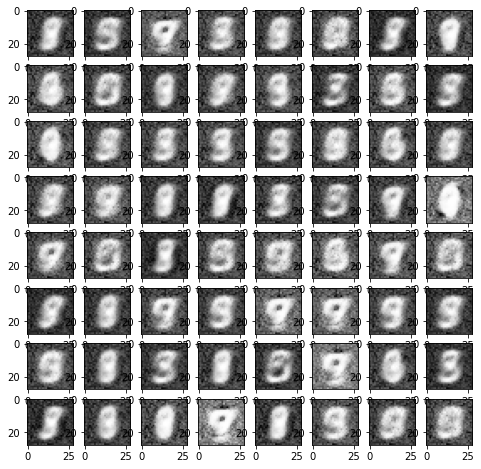

Epoch:  5
Discriminator Real Loss:  tensor(0.6080, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1153, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.1804, grad_fn=<BinaryCrossEntropyBackward0>)


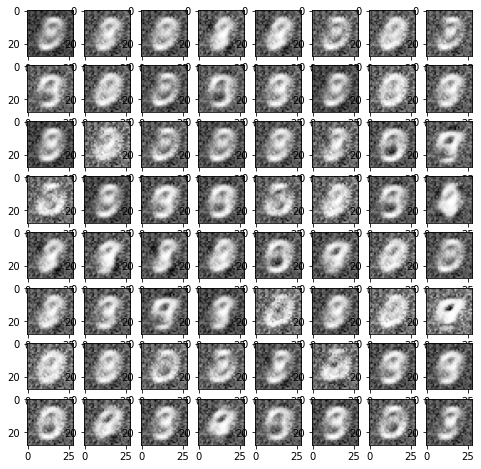

Epoch:  5
Discriminator Real Loss:  tensor(0.1287, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0609, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(5.2284, grad_fn=<BinaryCrossEntropyBackward0>)


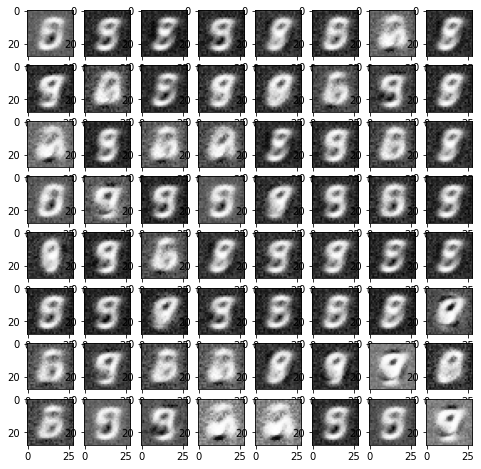

Epoch:  5
Discriminator Real Loss:  tensor(0.3959, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1232, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.0316, grad_fn=<BinaryCrossEntropyBackward0>)


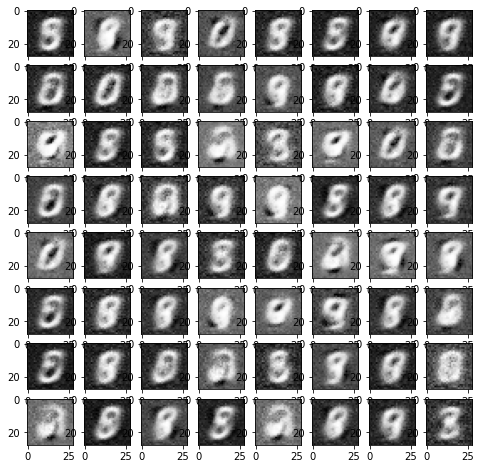

Epoch:  5
Discriminator Real Loss:  tensor(0.0972, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0767, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.6834, grad_fn=<BinaryCrossEntropyBackward0>)


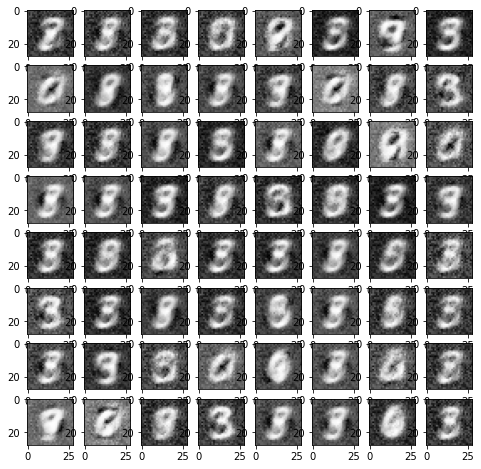

Epoch:  6
Discriminator Real Loss:  tensor(0.1627, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1177, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.6347, grad_fn=<BinaryCrossEntropyBackward0>)


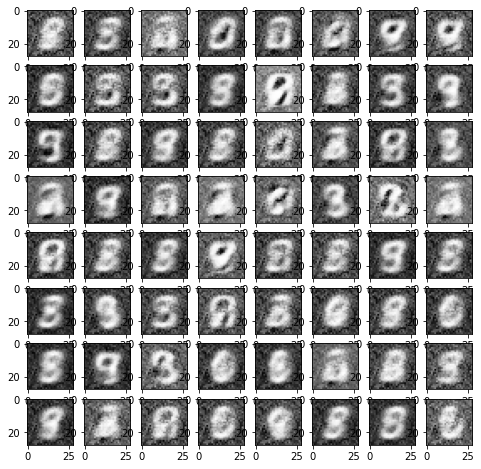

Epoch:  6
Discriminator Real Loss:  tensor(0.1954, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0508, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(6.1282, grad_fn=<BinaryCrossEntropyBackward0>)


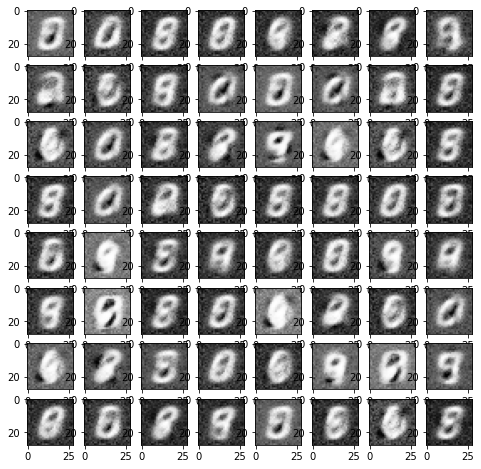

Epoch:  6
Discriminator Real Loss:  tensor(0.1345, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0239, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(6.2897, grad_fn=<BinaryCrossEntropyBackward0>)


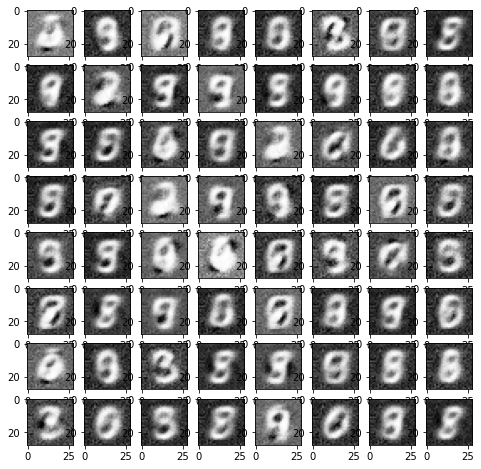

Epoch:  6
Discriminator Real Loss:  tensor(0.3303, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.2049, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.8715, grad_fn=<BinaryCrossEntropyBackward0>)


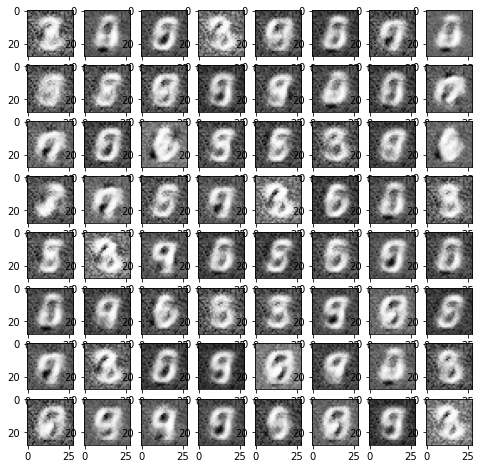

Epoch:  7
Discriminator Real Loss:  tensor(0.1349, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0941, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(5.7692, grad_fn=<BinaryCrossEntropyBackward0>)


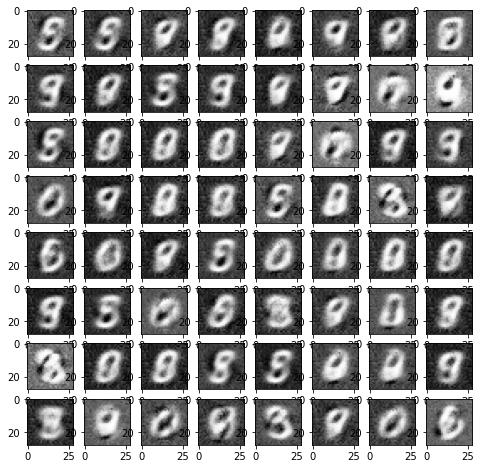

Epoch:  7
Discriminator Real Loss:  tensor(0.0887, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.2374, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.8018, grad_fn=<BinaryCrossEntropyBackward0>)


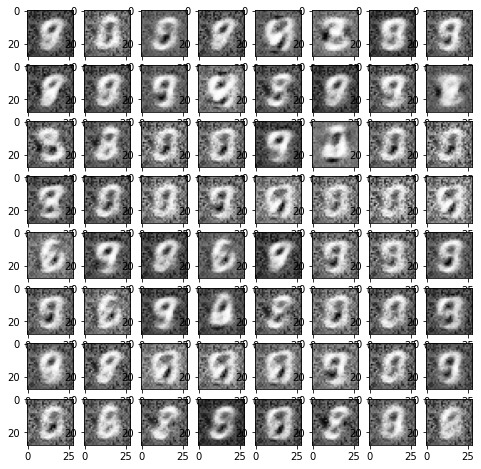

Epoch:  7
Discriminator Real Loss:  tensor(0.3690, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0586, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(7.2300, grad_fn=<BinaryCrossEntropyBackward0>)


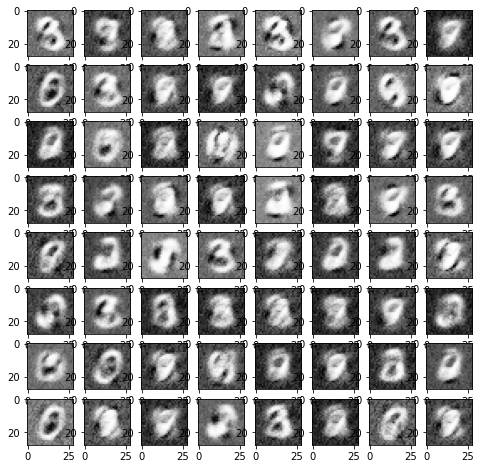

Epoch:  7
Discriminator Real Loss:  tensor(0.0245, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1486, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.8227, grad_fn=<BinaryCrossEntropyBackward0>)


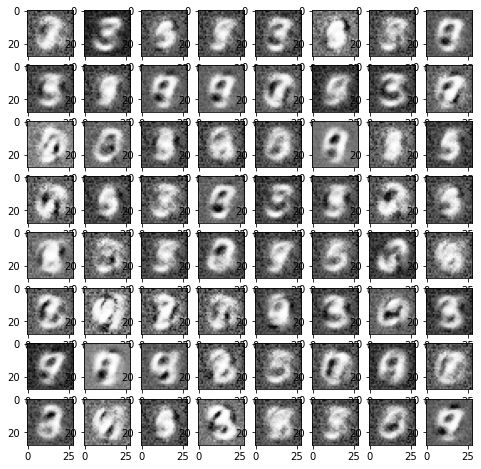

Epoch:  8
Discriminator Real Loss:  tensor(0.2526, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1300, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(5.6728, grad_fn=<BinaryCrossEntropyBackward0>)


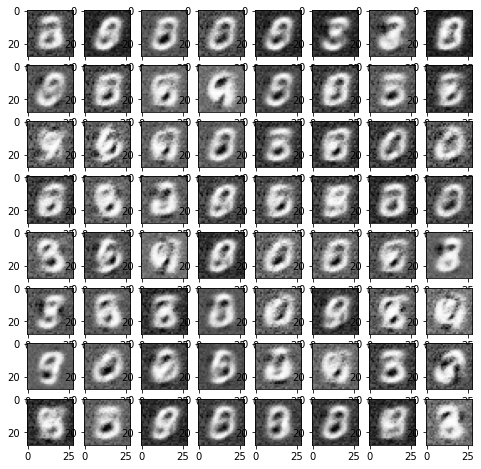

Epoch:  8
Discriminator Real Loss:  tensor(0.1130, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0897, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(3.8264, grad_fn=<BinaryCrossEntropyBackward0>)


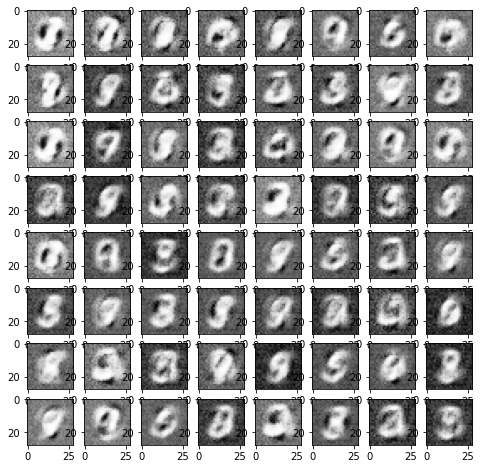

Epoch:  8
Discriminator Real Loss:  tensor(0.1253, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1006, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.9356, grad_fn=<BinaryCrossEntropyBackward0>)


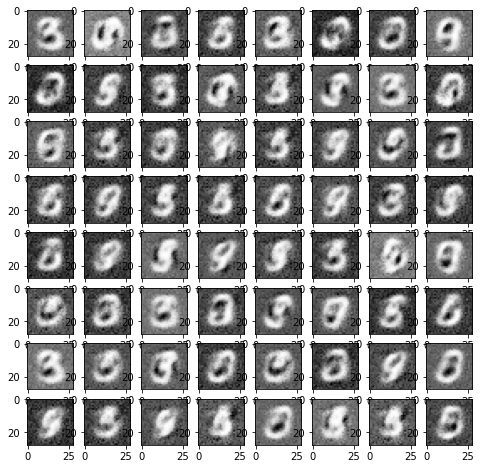

Epoch:  8
Discriminator Real Loss:  tensor(0.0978, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0137, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(5.5762, grad_fn=<BinaryCrossEntropyBackward0>)


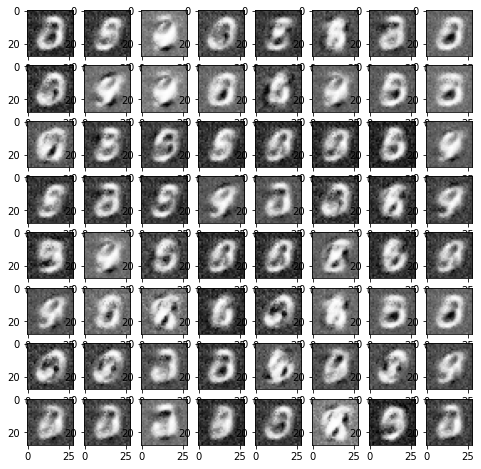

Epoch:  9
Discriminator Real Loss:  tensor(0.0859, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0571, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.5424, grad_fn=<BinaryCrossEntropyBackward0>)


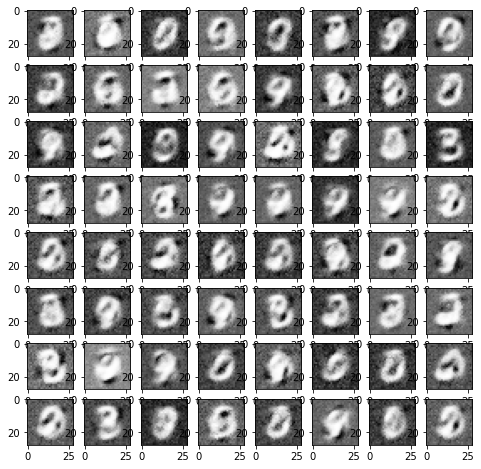

Epoch:  9
Discriminator Real Loss:  tensor(0.1840, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0884, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(5.1706, grad_fn=<BinaryCrossEntropyBackward0>)


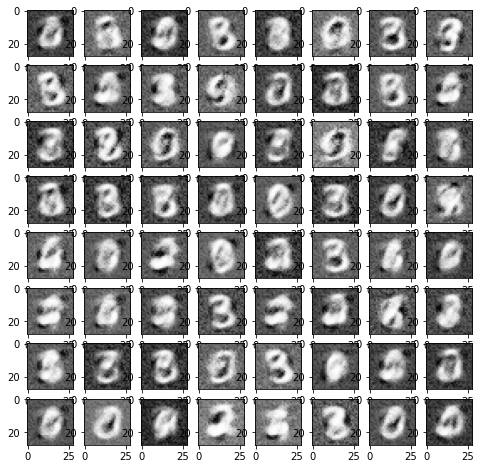

Epoch:  9
Discriminator Real Loss:  tensor(0.0988, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.0383, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(6.3807, grad_fn=<BinaryCrossEntropyBackward0>)


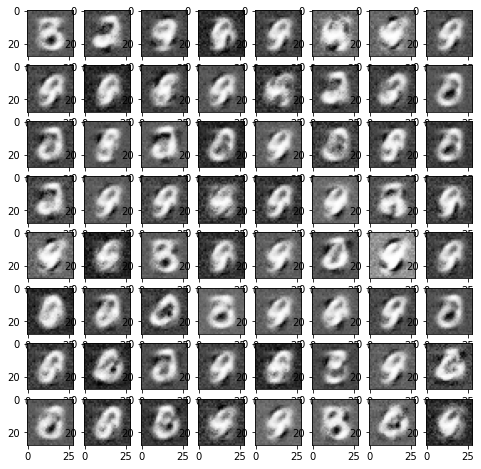

Epoch:  9
Discriminator Real Loss:  tensor(0.0319, grad_fn=<BinaryCrossEntropyBackward0>)
Discriminator Fake Loss:  tensor(0.1435, grad_fn=<BinaryCrossEntropyBackward0>)
Generator Real Loss:  tensor(4.8036, grad_fn=<BinaryCrossEntropyBackward0>)


In [11]:
def train_v1(train_loader, generator, discriminator, d_optim, g_optim, num_epochs=10):
    for epoch in range(num_epochs):
        cnt = 0
        for images, labels in train_loader:
            cnt += 1
            real_samples = torch.flatten(images, start_dim=1)
            # print(real_samples.shape)
            fake_samples = generate_fake_samples(generator)
            # display fake samples
            if cnt % 200 == 0:
                display_fake_samples(fake_samples.detach())
            # calculate discriminator loss
            d_optim.zero_grad()
            # d_real_loss = torch.mean(torch.log(discriminator(real_samples)))
            d_real_loss = criterion(discriminator(real_samples), torch.ones(batch_size, 1))
            if cnt % 200 == 0:
                print("Epoch: ", epoch)
                print("Discriminator Real Loss: ", d_real_loss)
            # d_fake_loss = torch.mean(torch.log(1 - discriminator(fake_samples.detach())))
            d_fake_loss = criterion(discriminator(fake_samples.detach()), torch.zeros(batch_size, 1))
            if cnt % 200 == 0:
                print("Discriminator Fake Loss: ", d_fake_loss)

            # backprop gradients, update weights
            d_real_loss.backward()
            d_fake_loss.backward()
            d_optim.step()

            # calculate generator loss
            g_optim.zero_grad()
            # g_loss = -torch.mean(torch.log(1 - discriminator(fake_samples)))
            g_loss = criterion(discriminator(fake_samples), torch.ones(batch_size, 1))
            if cnt % 200 == 0:
                print("Generator Real Loss: ", g_loss)
            # backprop gradients, update weights
            g_loss.backward()
            g_optim.step()
    
train_v1(train_loader, generator, discriminator, d_optim, g_optim)